In [2]:
import plotly
import plotly.graph_objs as go

import numpy as np
import json

plotly.offline.init_notebook_mode()

joint_name = ['r_shoulder_pitch', 'r_shoulder_roll', 'r_shoulder_yaw', 'r_elbow_pitch', 'r_wrist_yaw', 'r_wrist_roll', 'r_wrist_pitch',
              'l_shoulder_pitch', 'l_shoulder_roll', 'l_shoulder_yaw', 'l_elbow_pitch', 'l_wrist_yaw', 'l_wrist_roll', 'l_wrist_pitch']
joint_limits = [
    [-2.61, 1.04], [0, 2.61], [-1.57, 1.57], [-1.57, 0], [-1.57, 1.57], [-0.36, 0.36], [-0.36, 0.36],
    [-1.04, 2.61], [-2.61, 0], [-1.57, 1.57], [0, 1.57], [-1.57, 1.57], [-0.36, 0.36], [-0.36, 0.36]
]

def draw(motion_id, interpolation):
    with open(f'../data/motion/{motion_id}/replay_data_{interpolation}.json', 'r') as f:
        data = json.load(f)
    
    N = len(data)
    t = [i for i in range(N)]
    for idx in range(14):
        plotly.offline.iplot([go.Scatter(x=t, y=[a['actual_joints'][idx] for a in data], name=f'actual {joint_name[idx]}'),
                              go.Scatter(x=t, y=[a['target_joints'][idx] for a in data], name=f'target {joint_name[idx]}'),
                              go.Scatter(x=t, y=[joint_limits[idx][0] for i in range(N)], name='MIN joint pos'),
                              go.Scatter(x=t, y=[joint_limits[idx][1] for i in range(N)], name='MAX joint pos'),],
                              image_height=600,
                              image_width=1600)

In [5]:
!pwd

/home/yifengz/workspace_ljh/robosuite-dev/robosuite/scripts


In [3]:
arms_hand_name = [
    'waist_yaw', 'waist_pitch', 'waist_roll', 'head_yaw', 'head_roll', 'head_pitch',
    'r_shoulder_pitch', 'r_shoulder_roll', 'r_shoulder_yaw', 'r_elbow_pitch', 'r_wrist_yaw', 'r_wrist_roll', 'r_wrist_pitch',
    'l_shoulder_pitch', 'l_shoulder_roll', 'l_shoulder_yaw', 'l_elbow_pitch', 'l_wrist_yaw', 'l_wrist_roll', 'l_wrist_pitch',
    'r_thumb_proximal_1', 'r_thumb_proximal_2', 'r_index_proximal', 'r_middle_proximal', 'r_ring_proximal', 'r_pinky_proximal', 
    'l_thumb_proximal_1', 'l_thumb_proximal_2', 'l_index_proximal', 'l_middle_proximal', 'l_ring_proximal', 'l_pinky_proximal',
]
def draw_arms_hand(data):
    N = len(data)
    t = [i for i in range(N)]
    for idx in range(32):
        plotly.offline.iplot([go.Scatter(x=t, y=[a['actual_position'][idx] for a in data], name=f'actual {arms_hand_name[idx]}'),
                              go.Scatter(x=t, y=[a['target_position'][idx] for a in data], name=f'target {arms_hand_name[idx]}'),],
                              image_height=600,
                              image_width=1600)

In [7]:
with open('../data000001_arm+hand_track.json', 'r') as f:
    data = json.load(f)
print("len(data)=", len(data))
print("data[0].shape=", len(data[185]['target_position']), len(data[185]['actual_position']))
draw_arms_hand(data)

len(data)= 540
data[0].shape= 32 32


In [26]:
hand_joint_name = ['r_thumb_proximal_1', 'r_thumb_proximal_2', 'r_index_proximal', 'r_middle_proximal', 'r_ring_proximal', 'r_pinky_proximal', 
              'l_thumb_proximal_1', 'l_thumb_proximal_2', 'l_index_proximal', 'l_middle_proximal', 'l_ring_proximal', 'l_pinky_proximal', ]

def draw_hand(data):
    N = len(data)
    t = [i for i in range(N)]
    for idx in range(12):
        plotly.offline.iplot([go.Scatter(x=t, y=[a['actual_position'][idx] for a in data], name=f'actual {hand_joint_name[idx]}'),
                            go.Scatter(x=t, y=[a['target_position'][idx] for a in data], name=f'target {hand_joint_name[idx]}'),],
                            image_height=600,
                            image_width=1600)

In [35]:
with open('../data_track_5cos.json', 'r') as f:
    data = json.load(f)
draw_hand(data)

In [27]:
with open('../data_track.json', 'r') as f:
    data = json.load(f)
draw_hand(data)


In [17]:
with open('../data.json', 'r') as f:
    data = json.load(f)

joint_name = ['r_thumb_proximal_1', 'r_thumb_proximal_2', 'r_index_proximal', 'r_middle_proximal', 'r_ring_proximal', 'r_pinky_proximal', 
              'l_thumb_proximal_1', 'l_thumb_proximal_2', 'l_index_proximal', 'l_middle_proximal', 'l_ring_proximal', 'l_pinky_proximal', ]

N = len(data)
t = [i for i in range(N)]
for idx in range(12):
    plotly.offline.iplot([go.Scatter(x=t, y=[a['actual_position'][idx] for a in data], name=f'actual {joint_name[idx]}'),
                          go.Scatter(x=t, y=[a['target_position'][idx] for a in data], name=f'target {joint_name[idx]}'),],
                          image_height=600,
                          image_width=1600)

In [3]:
motion_id = '000228'
interpolation = 'min_jerk'
draw(motion_id, interpolation)

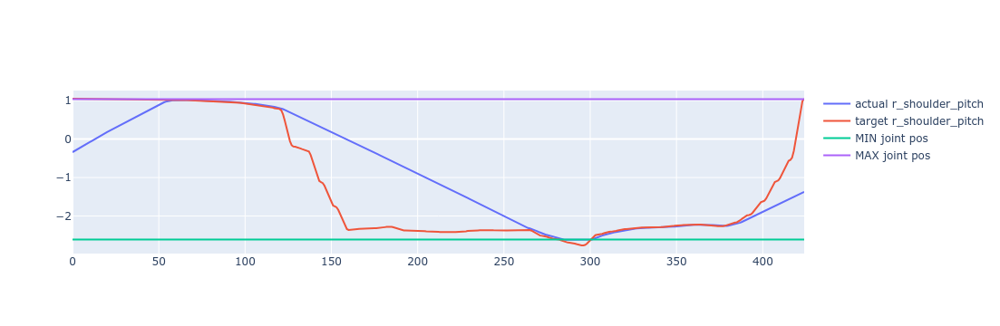

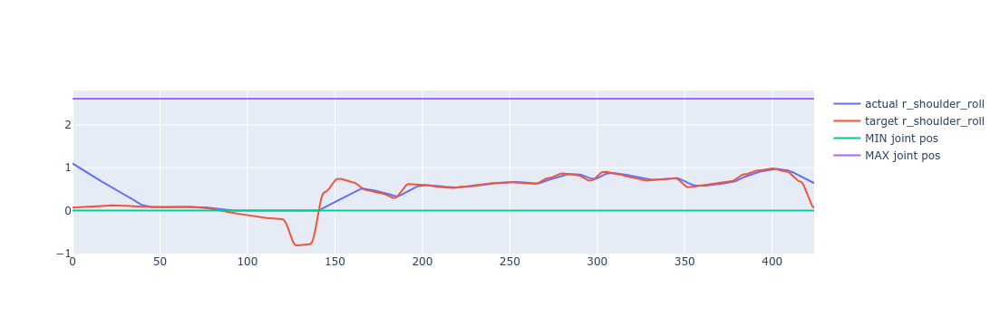

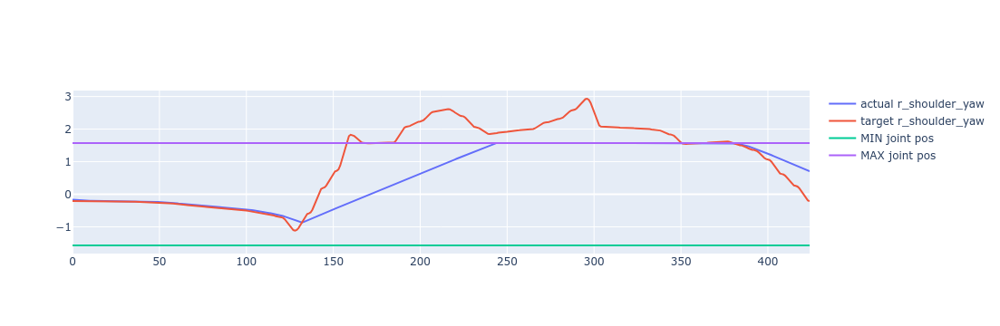

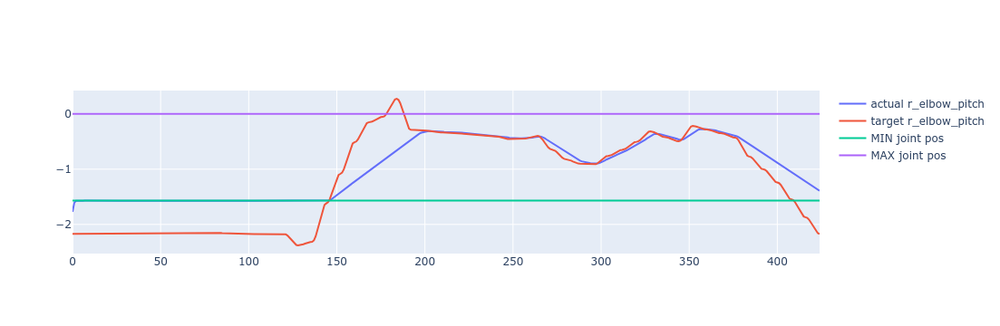

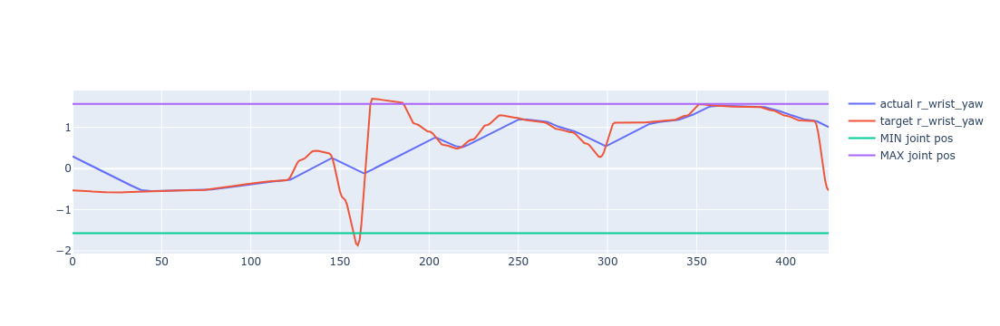

...

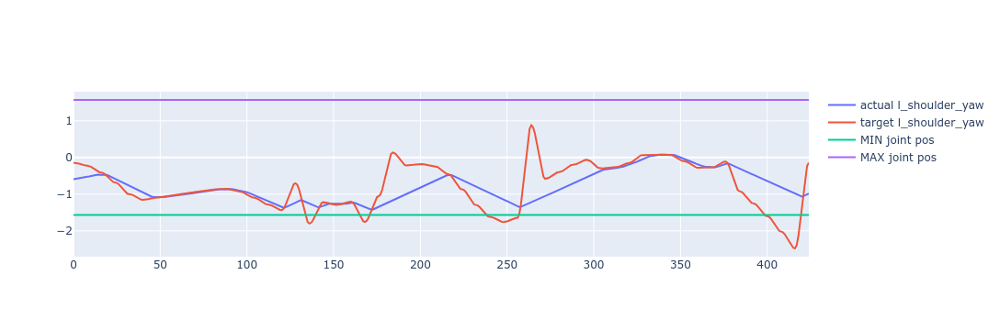

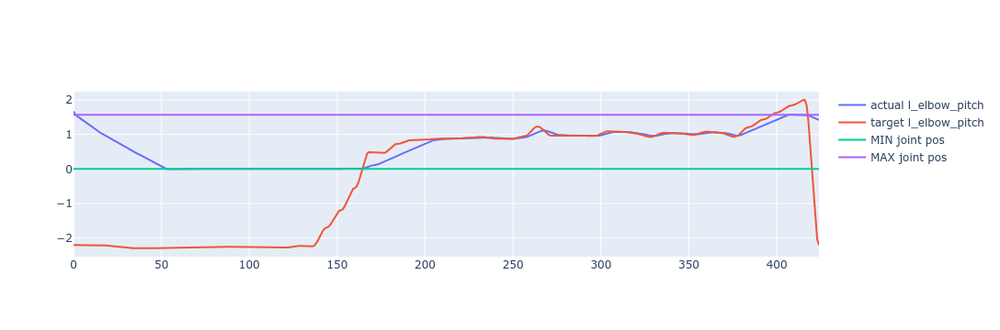

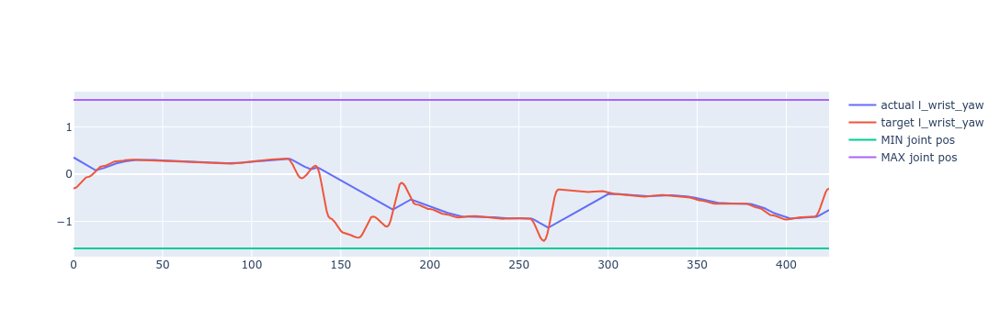

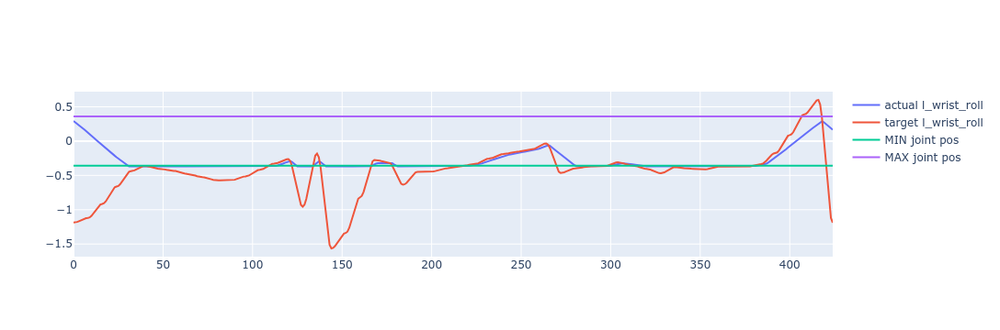

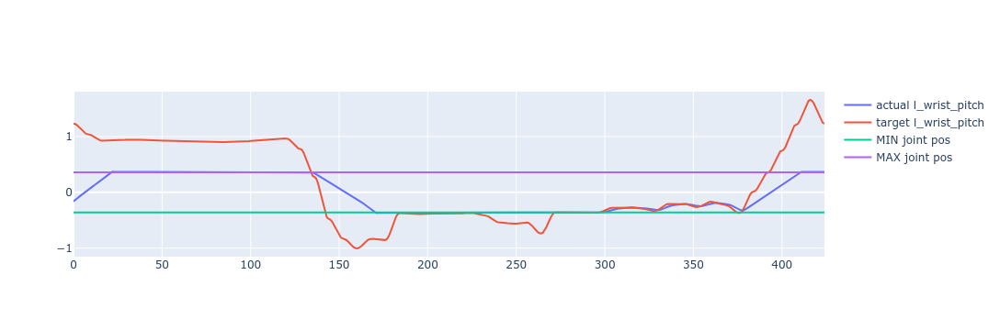

In [23]:
motion_id = '010209'
interpolation = 'cosine'
draw(motion_id, interpolation)